# IMPORTING THE LIBRARIES

In [1]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
import seaborn as sns
import matplotlib.pyplot as plt
get_ipython().run_line_magic('matplotlib', 'inline')
sns.set(style='white', context='notebook', palette='deep')

import warnings
warnings.filterwarnings('ignore')

# READ & LOAD THE TRAIN/TEST DATA

## TRAIN DATA

In [2]:
train = pd.read_csv('adult.data', header = None)

#add header to the dataframe
train_columns_headings = ['age','workclass','fnlwgt','education','education-num','marital-status','occupation','relationship','race','sex','capital-gain','capital-loss','hours-per-week','native-country','label']
train.columns = train_columns_headings
train

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,label
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [3]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education-num   32561 non-null  int64 
 5   marital-status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital-gain    32561 non-null  int64 
 11  capital-loss    32561 non-null  int64 
 12  hours-per-week  32561 non-null  int64 
 13  native-country  32561 non-null  object
 14  label           32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [4]:
train.describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


## TEST DATA

In [5]:
test = pd.read_csv('adult.test', header = None)

test_columns_headings = ['age','workclass','fnlwgt','education','education-num','marital-status','occupation','relationship','race','sex','capital-gain','capital-loss','hours-per-week','native-country','label']
test.columns = test_columns_headings

test

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,label
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K.
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K.
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K.
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K.
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16276,39,Private,215419,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,<=50K.
16277,64,?,321403,HS-grad,9,Widowed,?,Other-relative,Black,Male,0,0,40,United-States,<=50K.
16278,38,Private,374983,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K.
16279,44,Private,83891,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,<=50K.


In [6]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16281 entries, 0 to 16280
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             16281 non-null  int64 
 1   workclass       16281 non-null  object
 2   fnlwgt          16281 non-null  int64 
 3   education       16281 non-null  object
 4   education-num   16281 non-null  int64 
 5   marital-status  16281 non-null  object
 6   occupation      16281 non-null  object
 7   relationship    16281 non-null  object
 8   race            16281 non-null  object
 9   sex             16281 non-null  object
 10  capital-gain    16281 non-null  int64 
 11  capital-loss    16281 non-null  int64 
 12  hours-per-week  16281 non-null  int64 
 13  native-country  16281 non-null  object
 14  label           16281 non-null  object
dtypes: int64(6), object(9)
memory usage: 1.9+ MB


In [7]:
test.describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,16281.000000,1.628100e+04,16281.000000,16281.000000,16281.000000,16281.000000
mean,38.767459,1.894357e+05,10.072907,1081.905104,87.899269,40.392236
std,13.849187,1.057149e+05,2.567545,7583.935968,403.105286,12.479332
min,17.000000,1.349200e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.167360e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.778310e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.383840e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.490400e+06,16.000000,99999.000000,3770.000000,99.000000


# DATA ANALYSIS BY FEATURES

In [8]:
#Changing the data labels  into 0's and 1's

train['label'].unique()
train['label'] = train['label'].replace(' <=50K', 0)
train['label'] = train['label'].replace(' >50K', 1)
train.head(10)


,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,label
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,0
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,0
5,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,0
6,49,Private,160187,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,0
7,52,Self-emp-not-inc,209642,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,1
8,31,Private,45781,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States,1
9,42,Private,159449,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,5178,0,40,United-States,1


In [9]:

test['label'].unique()
test['label'] = test['label'].replace(' <=50K.', 0)
test['label'] = test['label'].replace(' >50K.', 1)
test.head(10)


,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,label
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,0
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,0
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,1
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,1
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,0
5,34,Private,198693,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,0
6,29,?,227026,HS-grad,9,Never-married,?,Unmarried,Black,Male,0,0,40,United-States,0
7,63,Self-emp-not-inc,104626,Prof-school,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,3103,0,32,United-States,1
8,24,Private,369667,Some-college,10,Never-married,Other-service,Unmarried,White,Female,0,0,40,United-States,0
9,55,Private,104996,7th-8th,4,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,10,United-States,0


In [10]:
train.describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,label
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456,0.240810
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429,0.427581
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000,0.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000,0.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000,0.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000,0.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000,1.000000


In [11]:
train['label'].mean()

0.2408095574460244

## INFORMATION ABOUT FEATURES IN DATA

## FUNCTION FOR PLOTTING

There are binary, categorical and continuious values

Numerical/Continuious values
*  Age
*  fnlwgt
* hours per week

categorical values
* Workclass
* Education
* Occupation
* Relationship
* Race
* native country

Numerical values
* Education Num

Binary values
* Gender


In [12]:
def categorical_f_count(feature_id, data, data_type):
    '''
    feature_id : The feature name type(string)
    data : pandas dataframe (Train/test)
    data_type : whether the data is test / train
    '''
    if data_type == 'train' :
        ax = sns.countplot(x = feature_id, hue = "label", data = data)
        print(data[[feature_id,"label"]].groupby([feature_id]).count().sort_values(by = 'label', ascending=False))
    else:
        ax = sns.countplot(x = feature_id,data = test)


def categorical_f_prob(feature_id, data):
    '''
    feature_id : The feature name type(string)
    data : pandas dataframe (Train/test)
    '''
    g = sns.factorplot(x = feature_id, y = "label", data = data, kind = "bar", size = 10 ,palette = "muted")
    g = g.set_ylabels("High Income Probability")
    print(data[[feature_id,"label"]].groupby([feature_id]).mean().sort_values(by = 'label', ascending = False))
    

def continuous_features(feature_id,data, lm_plot = False):
    '''
    feature_id : The feature name type(string)
    data : pandas dataframe (Train/test)
    '''
    fig = plt.figure(figsize=(10,8))

    axis = sns.kdeplot(data.loc[(data['label'] == 1), feature_id], color = 'g', shade = True, label = '>50')
    axis = sns.kdeplot(data.loc[(data['label'] == 0), feature_id], color = 'b', shade = True, label = '<=50')
    plt.title(feature_id + ' - Income >50 vs <=50', fontsize = 20)
    plt.xlabel(feature_id, fontsize = 12)
    plt.ylabel('Frequency', fontsize = 12)

    if lm_plot:
        sns.lmplot(feature_id, 'label', data)


In [13]:
print('a' + ' b')

a b


### UNIQUE VALUES

There are no null values explicitly, but there are values which has values which are turned to nan values. These nan values have to be treated

### FEATURE ANALYSIS

### *AGE*

*Continuous variable (int)*

In [14]:
#AGE -  

print("Train \n", train['age'].unique())
print("Test \n", test['age'].unique())


Train 
 [39 50 38 53 28 37 49 52 31 42 30 23 32 40 34 25 43 54 35 59 56 19 20 45
 22 48 21 24 57 44 41 29 18 47 46 36 79 27 67 33 76 17 55 61 70 64 71 68
 66 51 58 26 60 90 75 65 77 62 63 80 72 74 69 73 81 78 88 82 83 84 85 86
 87]
Test 
 [25 38 28 44 18 34 29 63 24 55 65 36 26 58 48 43 20 37 40 72 45 22 23 54
 32 46 56 17 39 52 21 42 33 30 47 41 19 69 50 31 59 49 51 27 57 61 64 79
 73 53 77 80 62 35 68 66 75 60 67 71 70 90 81 74 78 82 83 85 76 84 89 88
 87]


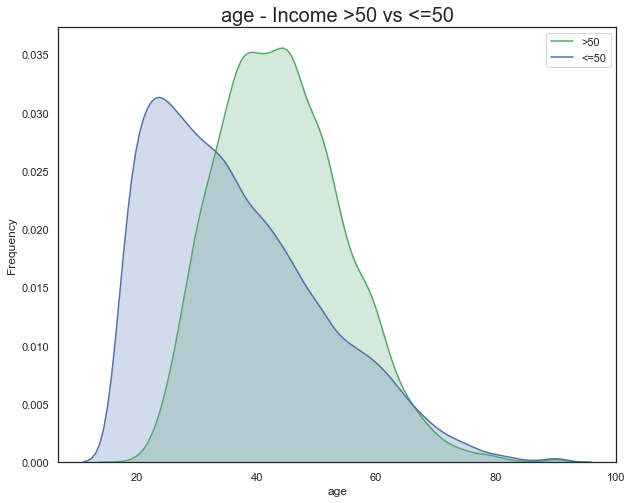

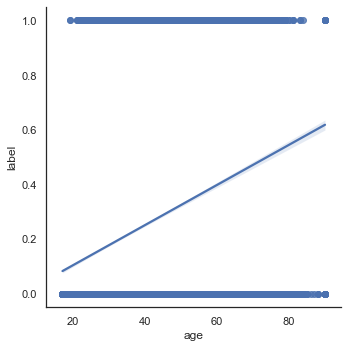

In [15]:
continuous_features('age', train, lm_plot = True)

### *WORKCLASS*

*Categorial variable (object)*

*AFTER ANALYSIS : Decision*

*Combine* 
* *state & local gov as one category * 

* *no-pay recieved & never worked as another category as their count and probabilties are similar*

In [16]:
# WORKCLASS - 
print("TRAIN \n \n")
print("before \n", train['workclass'].unique())
train['workclass'] = train['workclass'].replace(' ?', np.nan)
print("after \n", train['workclass'].unique())

print("TEST \n \n")
print("before \n", test['workclass'].unique())
test['workclass'] = test['workclass'].replace(' ?', np.nan)
print("after \n", test['workclass'].unique())

TRAIN 
 

before 
 [' State-gov' ' Self-emp-not-inc' ' Private' ' Federal-gov' ' Local-gov'
 ' ?' ' Self-emp-inc' ' Without-pay' ' Never-worked']
after 
 [' State-gov' ' Self-emp-not-inc' ' Private' ' Federal-gov' ' Local-gov'
 nan ' Self-emp-inc' ' Without-pay' ' Never-worked']
TEST 
 

before 
 [' Private' ' Local-gov' ' ?' ' Self-emp-not-inc' ' Federal-gov'
 ' State-gov' ' Self-emp-inc' ' Without-pay' ' Never-worked']
after 
 [' Private' ' Local-gov' nan ' Self-emp-not-inc' ' Federal-gov'
 ' State-gov' ' Self-emp-inc' ' Without-pay' ' Never-worked']


label
workclass               
 Private           22696
 Self-emp-not-inc   2541
 Local-gov          2093
 State-gov          1298
 Self-emp-inc       1116
 Federal-gov         960
 Without-pay          14
 Never-worked          7


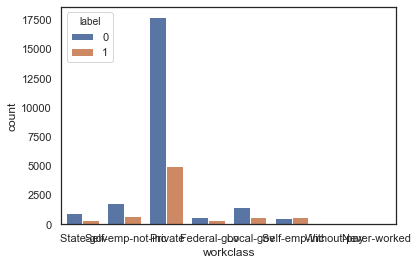

In [17]:
categorical_f_count("workclass", train, 'train')

label
workclass                  
 Self-emp-inc      0.557348
 Federal-gov       0.386458
 Local-gov         0.294792
 Self-emp-not-inc  0.284927
 State-gov         0.271957
 Private           0.218673
 Never-worked      0.000000
 Without-pay       0.000000


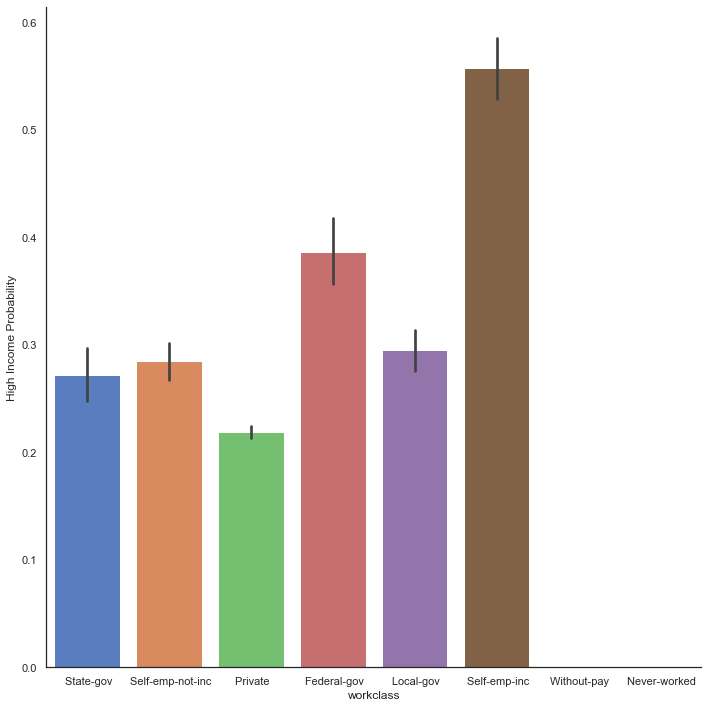

In [18]:
categorical_f_prob("workclass", train)

### *FNLWGT*
*continuous variables (int)*

*AFTER ANALYSIS - Decision*

*The fnlwgt column can be dropped because there is no variation between the high income (>50) and low income (=<50)*

In [19]:
#fnwgt - continuous variables (int)

train_uniques = train['fnlwgt'].unique()
print("Train \n ", train_uniques )
print(train_uniques.size)

#21648 out of 32561 

test_uniques = test['fnlwgt'].unique()
print("Test \n ", test_uniques)
test_uniques.size

#12787 out of 16281 


Train 
  [ 77516  83311 215646 ...  34066  84661 257302]
21648
Test 
  [226802  89814 336951 ... 349230 321403  83891]


12787

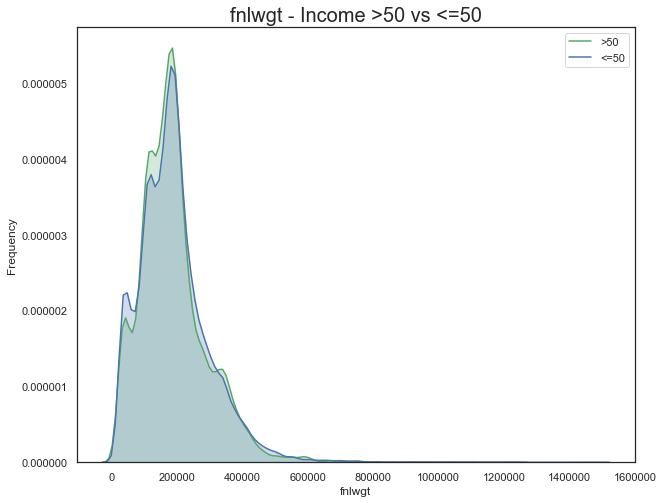

In [20]:
continuous_features('fnlwgt', train)

### *EDUCATION*

*categorical variable*

*AFTER ANALYSIS - Decision*
 
 *Combine*
* *Doctarate & Prof School*
* *Ass voc & Ass acdm*
* *All the class below 12*

In [21]:
#education - continous variables (object)

print("Train \n", train['education'].unique())
print("Test \n", test['education'].unique())

Train 
 [' Bachelors' ' HS-grad' ' 11th' ' Masters' ' 9th' ' Some-college'
 ' Assoc-acdm' ' Assoc-voc' ' 7th-8th' ' Doctorate' ' Prof-school'
 ' 5th-6th' ' 10th' ' 1st-4th' ' Preschool' ' 12th']
Test 
 [' 11th' ' HS-grad' ' Assoc-acdm' ' Some-college' ' 10th' ' Prof-school'
 ' 7th-8th' ' Bachelors' ' Masters' ' Doctorate' ' 5th-6th' ' Assoc-voc'
 ' 9th' ' 12th' ' 1st-4th' ' Preschool']


label
education           
 HS-grad       10501
 Some-college   7291
 Bachelors      5355
 Masters        1723
 Assoc-voc      1382
 11th           1175
 Assoc-acdm     1067
 10th            933
 7th-8th         646
 Prof-school     576
 9th             514
 12th            433
 Doctorate       413
 5th-6th         333
 1st-4th         168
 Preschool        51


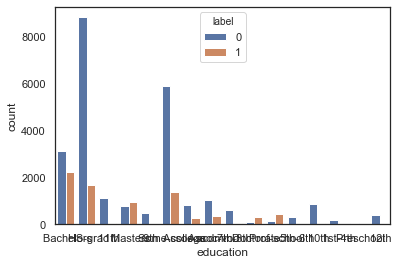

In [22]:
categorical_f_count("education", train, 'train')

label
education              
 Doctorate     0.740920
 Prof-school   0.734375
 Masters       0.556587
 Bachelors     0.414753
 Assoc-voc     0.261216
 Assoc-acdm    0.248360
 Some-college  0.190235
 HS-grad       0.159509
 12th          0.076212
 10th          0.066452
 7th-8th       0.061920
 9th           0.052529
 11th          0.051064
 5th-6th       0.048048
 1st-4th       0.035714
 Preschool     0.000000


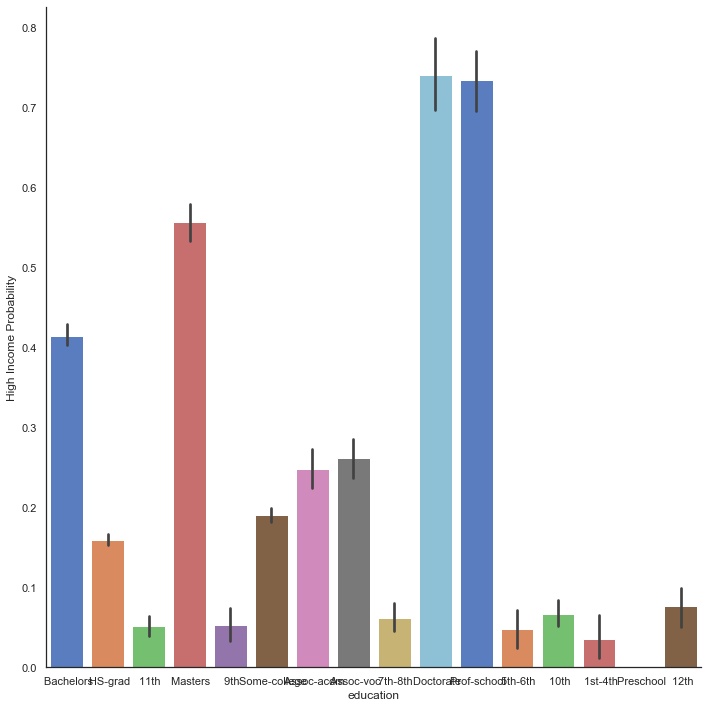

In [23]:
categorical_f_prob("education", train)

###  *education-num*

*continuoius variable*

*AFTER ANALYSSI : Decision*

*Make it into bins*

In [24]:

print("Train \n", train['education-num'].unique())
print("Test \n", train['education-num'].unique())

Train 
 [13  9  7 14  5 10 12 11  4 16 15  3  6  2  1  8]
Test 
 [13  9  7 14  5 10 12 11  4 16 15  3  6  2  1  8]


### *MARITAL-STATUS*


In [25]:
print(" Train \n ", train['marital-status'].unique())
print(" Test \n ", test['marital-status'].unique())

Train 
  [' Never-married' ' Married-civ-spouse' ' Divorced'
 ' Married-spouse-absent' ' Separated' ' Married-AF-spouse' ' Widowed']
 Test 
  [' Never-married' ' Married-civ-spouse' ' Widowed' ' Divorced'
 ' Separated' ' Married-spouse-absent' ' Married-AF-spouse']


label
marital-status               
 Married-civ-spouse     14976
 Never-married          10683
 Divorced                4443
 Separated               1025
 Widowed                  993
 Married-spouse-absent    418
 Married-AF-spouse         23


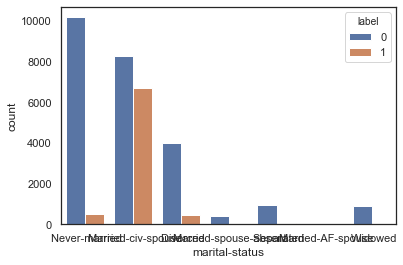

In [26]:
categorical_f_count("marital-status", train, 'train')

### *MARITAL-STATUS*

In [27]:
print(" Train \n ", train['marital-status'].unique())
print(" Test \n ", test['marital-status'].unique())

Train 
  [' Never-married' ' Married-civ-spouse' ' Divorced'
 ' Married-spouse-absent' ' Separated' ' Married-AF-spouse' ' Widowed']
 Test 
  [' Never-married' ' Married-civ-spouse' ' Widowed' ' Divorced'
 ' Separated' ' Married-spouse-absent' ' Married-AF-spouse']


label
marital-status               
 Married-civ-spouse     14976
 Never-married          10683
 Divorced                4443
 Separated               1025
 Widowed                  993
 Married-spouse-absent    418
 Married-AF-spouse         23


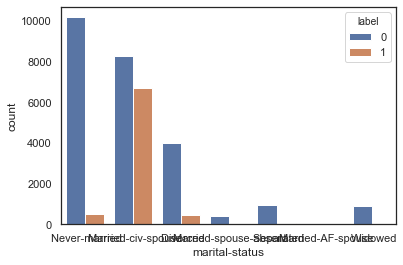

In [28]:
categorical_f_count("marital-status", train, 'train')

label
marital-status                  
 Married-civ-spouse     0.446848
 Married-AF-spouse      0.434783
 Divorced               0.104209
 Widowed                0.085599
 Married-spouse-absent  0.081340
 Separated              0.064390
 Never-married          0.045961


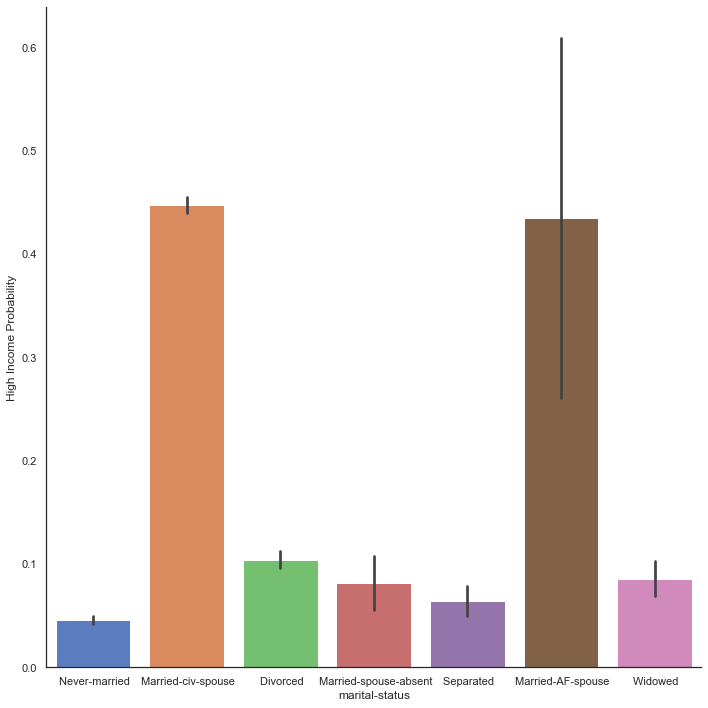

In [29]:
categorical_f_prob("marital-status", train)

label
marital-status                  
 Married-civ-spouse     0.446848
 Married-AF-spouse      0.434783
 Divorced               0.104209
 Widowed                0.085599
 Married-spouse-absent  0.081340
 Separated              0.064390
 Never-married          0.045961


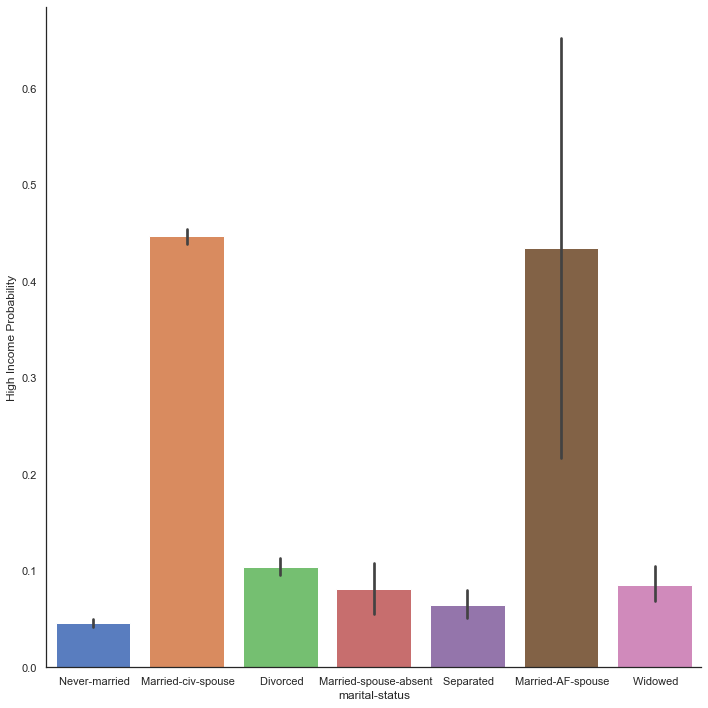

In [30]:
categorical_f_prob("marital-status", train)

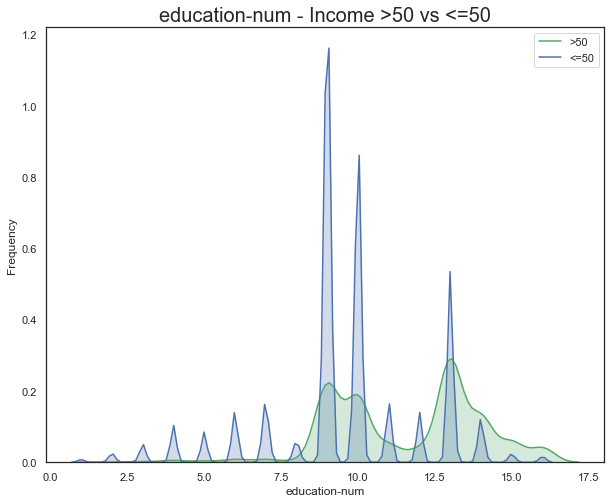

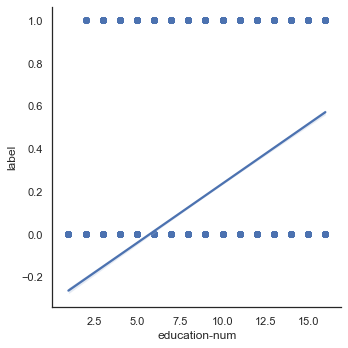

In [31]:
continuous_features('education-num', train, lm_plot = True)

### *OCCUPATION*

*categorical variable*

*AFTER ANALYSIS: Decision*

*Combine*
* *Exec - mangerial &  Prof-speciality*
* *Prot-serv & Tech-Support *
* *Craft repair & Transp-mov ??*
* *Adm-clerical & Machine-op-inspct & Farming-fishing & Armed-Forces*
* *Handlers-cleaners & Other-service & Priv-house-serv*




In [32]:
print("TRAIN \n \n")
print("before \n", train['occupation'].unique())
train['occupation'] = train['occupation'].replace(' ?', np.nan)
print("after \n", train['occupation'].unique())

print("TEST \n \n")
print("before \n", test['occupation'].unique())
test['occupation'] = test['occupation'].replace(' ?', np.nan)
print("after \n", test['occupation'].unique())

TRAIN 
 

before 
 [' Adm-clerical' ' Exec-managerial' ' Handlers-cleaners' ' Prof-specialty'
 ' Other-service' ' Sales' ' Craft-repair' ' Transport-moving'
 ' Farming-fishing' ' Machine-op-inspct' ' Tech-support' ' ?'
 ' Protective-serv' ' Armed-Forces' ' Priv-house-serv']
after 
 [' Adm-clerical' ' Exec-managerial' ' Handlers-cleaners' ' Prof-specialty'
 ' Other-service' ' Sales' ' Craft-repair' ' Transport-moving'
 ' Farming-fishing' ' Machine-op-inspct' ' Tech-support' nan
 ' Protective-serv' ' Armed-Forces' ' Priv-house-serv']
TEST 
 

before 
 [' Machine-op-inspct' ' Farming-fishing' ' Protective-serv' ' ?'
 ' Other-service' ' Prof-specialty' ' Craft-repair' ' Adm-clerical'
 ' Exec-managerial' ' Tech-support' ' Sales' ' Priv-house-serv'
 ' Transport-moving' ' Handlers-cleaners' ' Armed-Forces']
after 
 [' Machine-op-inspct' ' Farming-fishing' ' Protective-serv' nan
 ' Other-service' ' Prof-specialty' ' Craft-repair' ' Adm-clerical'
 ' Exec-managerial' ' Tech-support' ' Sales' ' P

label
occupation               
 Prof-specialty      4140
 Craft-repair        4099
 Exec-managerial     4066
 Adm-clerical        3770
 Sales               3650
 Other-service       3295
 Machine-op-inspct   2002
 Transport-moving    1597
 Handlers-cleaners   1370
 Farming-fishing      994
 Tech-support         928
 Protective-serv      649
 Priv-house-serv      149
 Armed-Forces           9


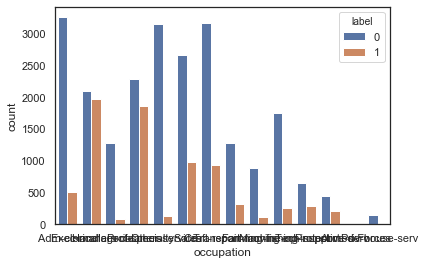

In [33]:
categorical_f_count("occupation", train, 'train')

label
occupation                  
 Exec-managerial    0.484014
 Prof-specialty     0.449034
 Protective-serv    0.325116
 Tech-support       0.304957
 Sales              0.269315
 Craft-repair       0.226641
 Transport-moving   0.200376
 Adm-clerical       0.134483
 Machine-op-inspct  0.124875
 Farming-fishing    0.115694
 Armed-Forces       0.111111
 Handlers-cleaners  0.062774
 Other-service      0.041578
 Priv-house-serv    0.006711


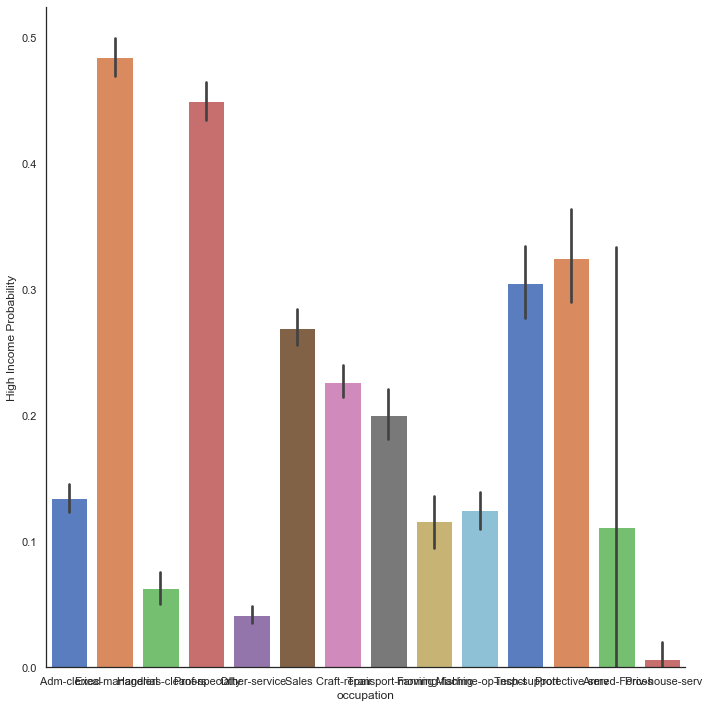

In [34]:
categorical_f_prob("occupation", train)

### *RELATIONSHIP*

*categorical variable*

*AFTER ANALYSIS : Decision*
 
 Combine
* *Own-child, Unmarried and other-relative*

In [35]:
print("Train \n", train['relationship'].unique())
print("Test \n", test['relationship'].unique())

Train 
 [' Not-in-family' ' Husband' ' Wife' ' Own-child' ' Unmarried'
 ' Other-relative']
Test 
 [' Own-child' ' Husband' ' Not-in-family' ' Unmarried' ' Wife'
 ' Other-relative']


label
relationship          
 Husband         13193
 Not-in-family    8305
 Own-child        5068
 Unmarried        3446
 Wife             1568
 Other-relative    981


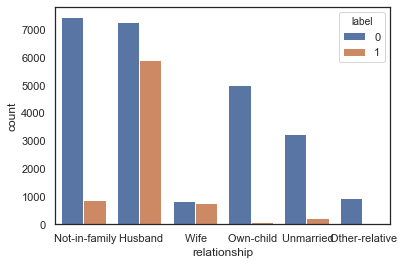

In [36]:
categorical_f_count("relationship", train, 'train')

label
relationship             
 Wife            0.475128
 Husband         0.448571
 Not-in-family   0.103070
 Unmarried       0.063262
 Other-relative  0.037717
 Own-child       0.013220


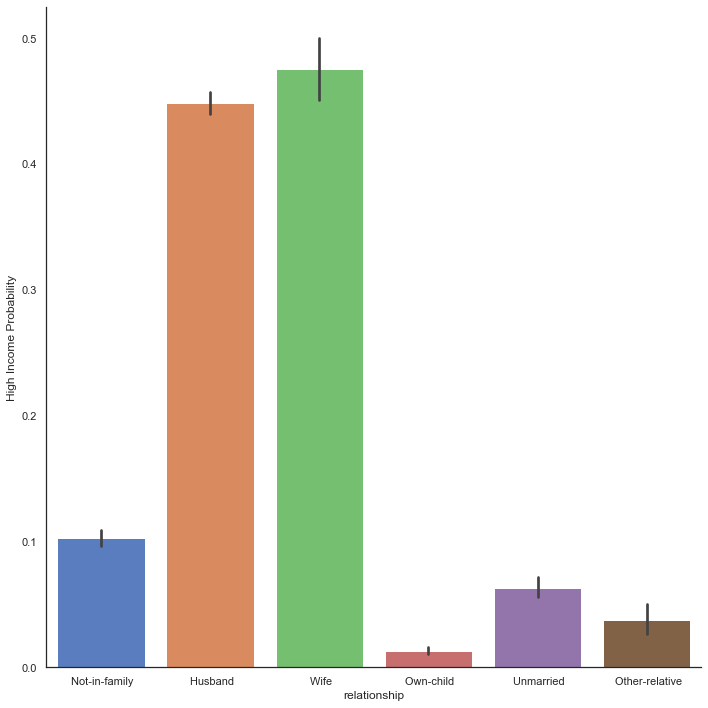

In [37]:
categorical_f_prob("relationship", train)

### *RACE*

*categorical variable*

*AFTER ANALYSIS: Decision*

*Combine*

* *Black & Asian-Pac-Islander & Other*

In [38]:
print("Train \n", train['race'].unique())
print("Test \n", test['race'].unique())

Train 
 [' White' ' Black' ' Asian-Pac-Islander' ' Amer-Indian-Eskimo' ' Other']
Test 
 [' Black' ' White' ' Asian-Pac-Islander' ' Other' ' Amer-Indian-Eskimo']


label
race                      
 White               27816
 Black                3124
 Asian-Pac-Islander   1039
 Amer-Indian-Eskimo    311
 Other                 271


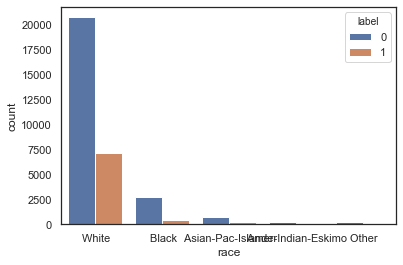

In [39]:
categorical_f_count("race", train, 'train')

label
race                         
 Asian-Pac-Islander  0.265640
 White               0.255860
 Black               0.123880
 Amer-Indian-Eskimo  0.115756
 Other               0.092251


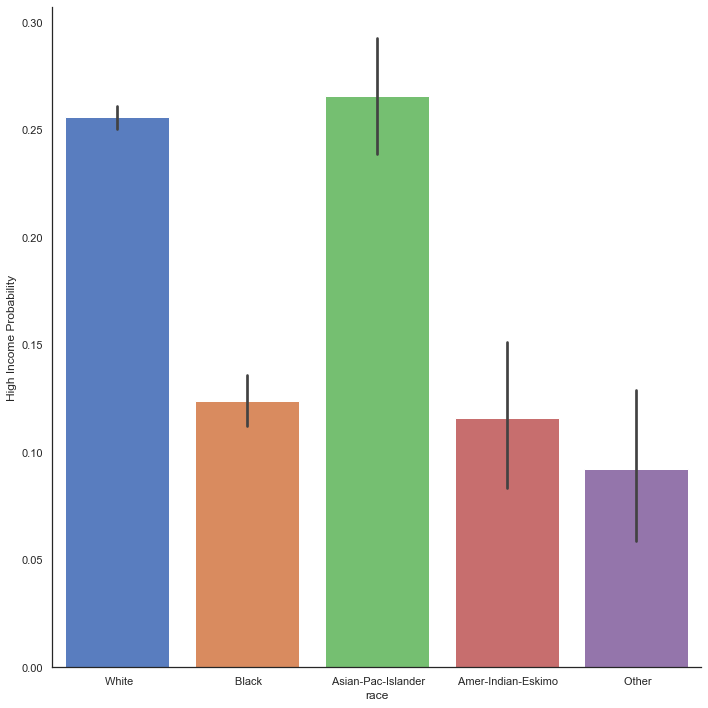

In [40]:
categorical_f_prob("race", train)

### *SEX*

*a categorical variable*

In [41]:
print("Train \n", train['sex'].unique())
print("Test \n", test['sex'].unique())

Train 
 [' Male' ' Female']
Test 
 [' Male' ' Female']


label
sex           
 Male    21790
 Female  10771


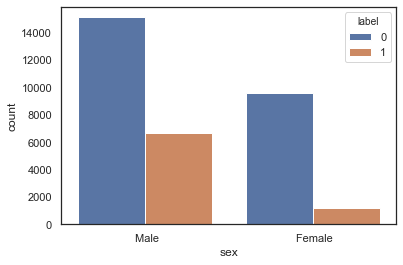

In [42]:
categorical_f_count("sex", train, 'train')

label
sex              
 Male    0.305737
 Female  0.109461


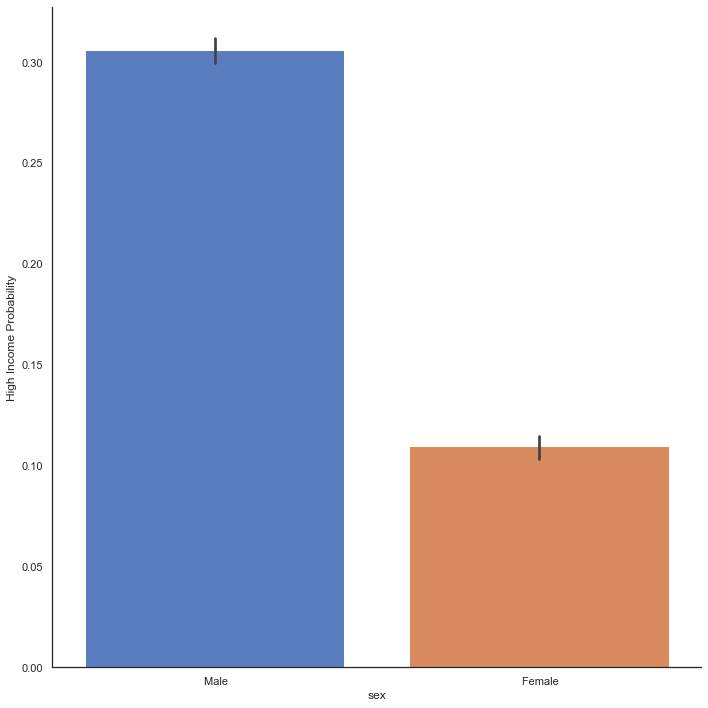

In [43]:
categorical_f_prob("sex", train)

### *CAPITAL GAIN*

In [44]:
print("Train \n",train['capital-gain'].unique())
print("Test \n",test['capital-gain'].unique())

Train 
 [ 2174     0 14084  5178  5013  2407 14344 15024  7688 34095  4064  4386
  7298  1409  3674  1055  3464  2050  2176   594 20051  6849  4101  1111
  8614  3411  2597 25236  4650  9386  2463  3103 10605  2964  3325  2580
  3471  4865 99999  6514  1471  2329  2105  2885 25124 10520  2202  2961
 27828  6767  2228  1506 13550  2635  5556  4787  3781  3137  3818  3942
   914   401  2829  2977  4934  2062  2354  5455 15020  1424  3273 22040
  4416  3908 10566   991  4931  1086  7430  6497   114  7896  2346  3418
  3432  2907  1151  2414  2290 15831 41310  4508  2538  3456  6418  1848
  3887  5721  9562  1455  2036  1831 11678  2936  2993  7443  6360  1797
  1173  4687  6723  2009  6097  2653  1639 18481  7978  2387  5060]
Test 
 [    0  7688  3103  6418  7298  3908 14084  5178 15024 99999  2597  2907
  4650  6497  1055  5013 27828  4934  4064  3674  2174 10605  3418   114
  2580  3411  4508  4386  8614 13550  6849  2463  3137  2885  2964  1471
 10566  2354  1424  1455  3325  4416 2523

### *CAPITAL-LOSS*

In [45]:
print("Train\n",train['capital-loss'].unique())
print("Test\n",test['capital-loss'].unique())

Train
 [   0 2042 1408 1902 1573 1887 1719 1762 1564 2179 1816 1980 1977 1876
 1340 2206 1741 1485 2339 2415 1380 1721 2051 2377 1669 2352 1672  653
 2392 1504 2001 1590 1651 1628 1848 1740 2002 1579 2258 1602  419 2547
 2174 2205 1726 2444 1138 2238  625  213 1539  880 1668 1092 1594 3004
 2231 1844  810 2824 2559 2057 1974  974 2149 1825 1735 1258 2129 2603
 2282  323 4356 2246 1617 1648 2489 3770 1755 3683 2267 2080 2457  155
 3900 2201 1944 2467 2163 2754 2472 1411]
Test
 [   0 1721 1876 2415 1887  625 1977 2057 1429 1590 1485 2051 2377 1672
 1628 1902 1602 1741 2444 1408 2001 2042 1740 1825 1848 1719 3004 2179
 1573 2205 1258 2339 1726 2258 1340 1504 2559 1668 1974 1980 1564 2547
 2002 1669 1617  323 3175 2472 2174 1579 2129 1510 1735 2282 1870 1411
 1911 1651 1092 1762 2457 2231 2238  653 1138 2246 2603 2392 1944 1380
 2465 1421 3770 1594  213 2149 2824 1844 2467 2163 1816 1648]


### *HOURS PER WEEK*

*continuous variable*

*AFTER ANALYSIS : Decision*

*Make into bins - Categorical*


In [46]:
print("Train \n", train['hours-per-week'].unique())
print("Test \n", test['hours-per-week'].unique())

Train 
 [40 13 16 45 50 80 30 35 60 20 52 44 15 25 38 43 55 48 58 32 70  2 22 56
 41 28 36 24 46 42 12 65  1 10 34 75 98 33 54  8  6 64 19 18 72  5  9 47
 37 21 26 14  4 59  7 99 53 39 62 57 78 90 66 11 49 84  3 17 68 27 85 31
 51 77 63 23 87 88 73 89 97 94 29 96 67 82 86 91 81 76 92 61 74 95]
Test 
 [40 50 30 32 10 39 35 48 25 20 45 47  6 43 90 54 60 38 36 18 24 44 56 28
 16 41 22 55 14 33 37  8 12 70 15 75 52 84 42 80 68 99 65  5 17 72 53 29
 96 21 46  3  1 23 49 67 76  7  2 58 26 34  4 51 78 63 31 92 77 27 85 13
 19 98 62 66 57 11 86 59  9 64 73 61 88 79 89 74 69]


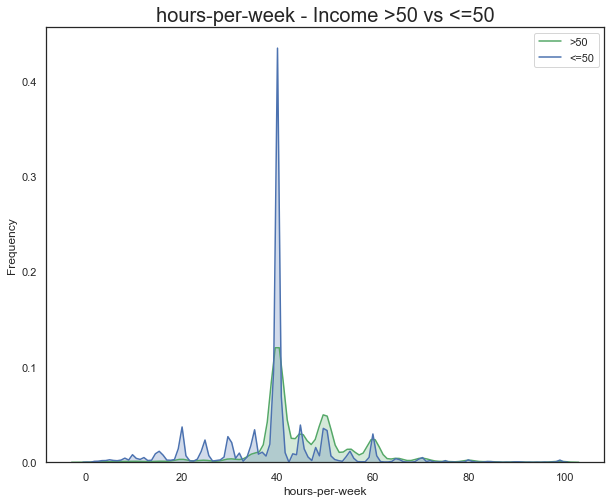

In [47]:
continuous_features('hours-per-week', train)

### *NATIVE-COUNTRY*

*A categorical variable*

*AFTER ANALYSIS - Decision*

*Covert to categorical values*

In [48]:
train['native-country'].unique()
train['native-country'] = train['native-country'].replace(' ?', np.nan)
train['native-country'].unique()

array([' United-States', ' Cuba', ' Jamaica', ' India', nan, ' Mexico',
       ' South', ' Puerto-Rico', ' Honduras', ' England', ' Canada',
       ' Germany', ' Iran', ' Philippines', ' Italy', ' Poland',
       ' Columbia', ' Cambodia', ' Thailand', ' Ecuador', ' Laos',
       ' Taiwan', ' Haiti', ' Portugal', ' Dominican-Republic',
       ' El-Salvador', ' France', ' Guatemala', ' China', ' Japan',
       ' Yugoslavia', ' Peru', ' Outlying-US(Guam-USVI-etc)', ' Scotland',
       ' Trinadad&Tobago', ' Greece', ' Nicaragua', ' Vietnam', ' Hong',
       ' Ireland', ' Hungary', ' Holand-Netherlands'], dtype=object)

In [49]:
test['native-country'].unique()
test['native-country'] = test['native-country'].replace(' ?', np.nan)
test['native-country'].unique()

array([' United-States', nan, ' Peru', ' Guatemala', ' Mexico',
       ' Dominican-Republic', ' Ireland', ' Germany', ' Philippines',
       ' Thailand', ' Haiti', ' El-Salvador', ' Puerto-Rico', ' Vietnam',
       ' South', ' Columbia', ' Japan', ' India', ' Cambodia', ' Poland',
       ' Laos', ' England', ' Cuba', ' Taiwan', ' Italy', ' Canada',
       ' Portugal', ' China', ' Nicaragua', ' Honduras', ' Iran',
       ' Scotland', ' Jamaica', ' Ecuador', ' Yugoslavia', ' Hungary',
       ' Hong', ' Greece', ' Trinadad&Tobago',
       ' Outlying-US(Guam-USVI-etc)', ' France'], dtype=object)

label
native-country                    
 United-States               29170
 Mexico                        643
 Philippines                   198
 Germany                       137
 Canada                        121
 Puerto-Rico                   114
 El-Salvador                   106
 India                         100
 Cuba                           95
 England                        90
 Jamaica                        81
 South                          80
 China                          75
 Italy                          73
 Dominican-Republic             70
 Vietnam                        67
 Guatemala                      64
 Japan                          62
 Poland                         60
 Columbia                       59
 Taiwan                         51
 Haiti                          44
 Iran                           43
 Portugal                       37
 Nicaragua                      34
 Peru                           31
 Greece                         29
 France       

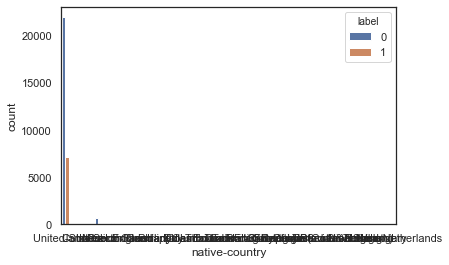

In [50]:
categorical_f_count("native-country", train, 'train')

label
native-country                       
 Iran                        0.418605
 France                      0.413793
 India                       0.400000
 Taiwan                      0.392157
 Japan                       0.387097
 Yugoslavia                  0.375000
 Cambodia                    0.368421
 Italy                       0.342466
 England                     0.333333
 Canada                      0.322314
 Germany                     0.321168
 Philippines                 0.308081
 Hong                        0.300000
 Greece                      0.275862
 China                       0.266667
 Cuba                        0.263158
 Scotland                    0.250000
 United-States               0.245835
 Hungary                     0.230769
 Ireland                     0.208333
 South                       0.200000
 Poland                      0.200000
 Thailand                    0.166667
 Ecuador                     0.142857
 Jamaica                     0.123457
 Laos 

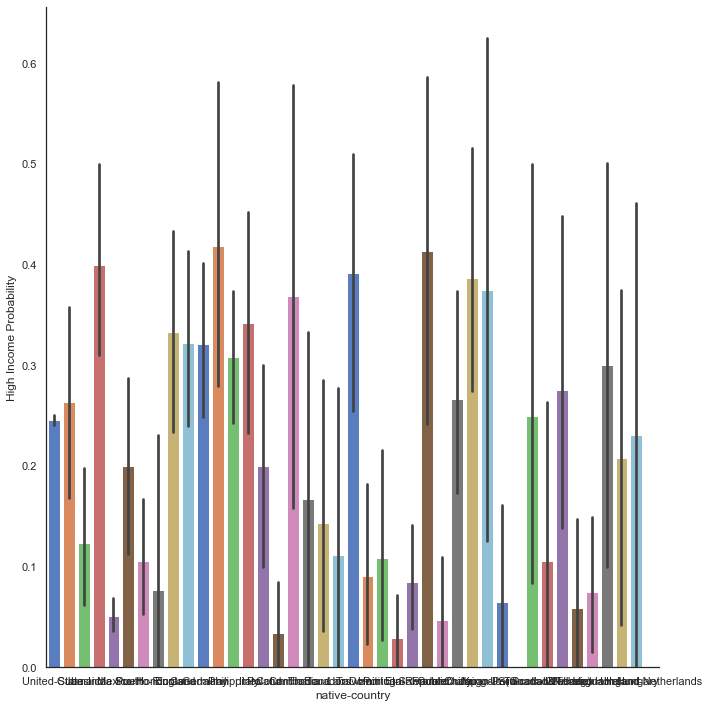

In [51]:
categorical_f_prob("native-country", train)

In [52]:
train['label'].unique()

array([0, 1], dtype=int64)

## Relational Feature Analysis

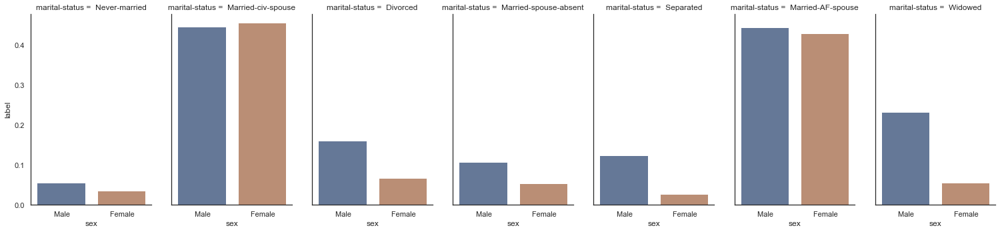

In [53]:

g = sns.catplot(x="sex", y="label", col= "marital-status", data=train, saturation=.5, kind="bar", ci=None, aspect=.6)

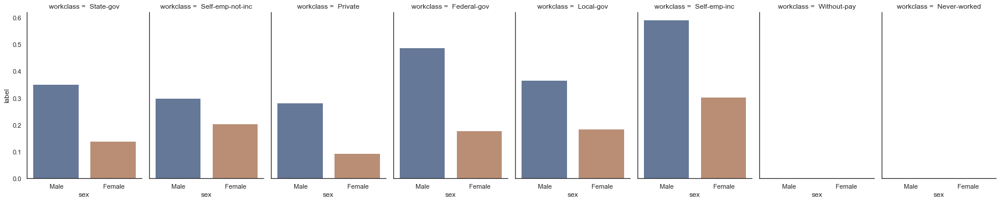

In [54]:
g = sns.catplot(x="sex", y="label", col="workclass", data=train, saturation=.5, kind="bar", ci=None, aspect=.6)

In [55]:
train['sex'].value_counts()

 Male      21790
 Female    10771
Name: sex, dtype: int64

## MISSING VALUES

### TRAIN

In [56]:
# Check missing values in train data set
train_na = (train.isnull().sum() / len(train)) * 100
train_na = train_na.drop(train_na[train_na == 0].index).sort_values(ascending=False)[:30]
miss_train = pd.DataFrame({'Train Missing Ratio' :train_na})
miss_train.head()

,Train Missing Ratio
occupation,5.660146
workclass,5.638647
native-country,1.790486


### TEST

In [57]:
test_na = (test.isnull().sum() / len(test)) * 100
print(test_na[test_na == 0].index)
test_na = test_na.drop(test_na[test_na == 0].index).sort_values(ascending = False)[:30]
miss_test = pd.DataFrame({'Test Missing Ratio' : test_na})
miss_test.head()

Index(['age', 'fnlwgt', 'education', 'education-num', 'marital-status',
       'relationship', 'race', 'sex', 'capital-gain', 'capital-loss',
       'hours-per-week', 'label'],
      dtype='object')


,Test Missing Ratio
occupation,5.933296
workclass,5.914870
native-country,1.682943


#  FEATURE ENGINEERING

## COMBINING TEST AND TRAIN DATA

In [58]:
train['source'] = 'train'
test['source'] = 'test'

combdata = pd.concat([train,test],ignore_index = True )
print(combdata.shape, train.shape, test.shape)

combdata 

(48842, 16) (32561, 16) (16281, 16)


,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,label,source
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,0,train
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,0,train
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,0,train
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,0,train
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,0,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,39,Private,215419,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,0,test
48838,64,NaN,321403,HS-grad,9,Widowed,NaN,Other-relative,Black,Male,0,0,40,United-States,0,test
48839,38,Private,374983,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,0,test
48840,44,Private,83891,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,0,test


##  DATA MANIPULATION

### REDUCING THE FEATURE CATEGORIES

### WORKCLASS
    Categorical values
* Self-emp-inc
* Federal-gov
* Private
* Self-emp-not-inc
* instate-gov : [' State-gov', ' Local-gov']
* no_pay : ['Without-pay', 'Never-worked']


In [59]:
#Grouping categories

combdata['workclass'] = combdata['workclass'].replace([' State-gov', ' Local-gov'], 'Instate-gov')
combdata['workclass'] = combdata['workclass'].replace(['Without-pay', 'Never-worked'], 'no_pay')
combdata['workclass'].unique()

array(['Instate-gov', ' Self-emp-not-inc', ' Private', ' Federal-gov',
       nan, ' Self-emp-inc', ' Without-pay', ' Never-worked'],
      dtype=object)

### EDUCATION


    Turn it into ordinal values
The categories to be made are:

*    6-'professional' = [' Doctorate', ' Prof-school']
*    5-' Masters'
*    4-' Bachelors'
*    3-'Assoc' = [' Assoc-acdm', ' Assoc-voc']
*    2-'HS/after' : [' HS-grad', ' Some-college']
*    1-'School' : [' 11th', ' 9th',' 7th-8th', ' 10th', ' 12th']
*    0-'Primary_School' : [' 5th-6th',  ' 1st-4th', ' Preschool']

In [60]:
# Grouping categories and making them ordinal (optional)

combdata['education'] = combdata['education'].replace([' Doctorate', ' Prof-school'],'Professional' )
combdata['education'] = combdata['education'].replace([' Assoc-acdm', ' Assoc-voc'], 'Assoc')
combdata['education'] = combdata['education'].replace([' HS-grad', ' Some-college'], 'HS/after')
combdata['education'] = combdata['education'].replace([' 11th', ' 9th',' 7th-8th', ' 5th-6th', ' 10th', ' Preschool', ' 12th'], 'School')
combdata['education'] = combdata['education'].replace([' 5th-6th', ' 1st-4th', ' Preschool'],'Primary_School')



combdata['education'] = combdata['education'].replace(['Professional', ' Masters', ' Bachelors', 'Assoc', 'HS/after', 'School', 'Primary_School'],[6,5,4,3,2,1,0])

combdata['education'].unique()

array([4, 2, 1, 5, 3, 6, 0], dtype=int64)

### MARITAL STATUS

We shall be making thes values of 'married' : 1 , 'not_married' : 0
We shall group up our status as follows:
    
1-'married' : [' Married-civ-spouse', ' Married-AF-spouse']
0-'not_married' : [' Never-married', ' Divorced', ' Married-spouse-absent',      'Separated', ' Widowed']

In [61]:
# Grouping categories
combdata['marital-status'] = combdata['marital-status'].replace([' Married-civ-spouse', ' Married-AF-spouse'], 'married')
combdata['marital-status'] = combdata['marital-status'].replace([' Never-married', ' Divorced', ' Married-spouse-absent', ' Separated', ' Widowed'], 'not_married')

# Making the categories ordinal
combdata['marital-status'] = combdata['marital-status'].replace(['married', 'not_married'], [1, 0])



combdata['marital-status'].unique()

array([0, 1], dtype=int64)

### OCCUPATION
    Categorical feature
    Grouping them to different Categorical values



* 'category_1' : [' Exec-managerial', ' Prof-specialty']
* 'category_2' : [' Protective-serv', ' Tech-support']
* 'category_3' : [' Sales']
* 'category_4' : [' Craft-repair', ' Transport-moving']
* 'category_5' : [' Adm-clerical', ' Machine-op-inspct', ' Farming-fishing', ' Armed-Forces']
* 'category_6' : [' Handlers-cleaners', ' Other-service', ' Priv-house-serv']


In [62]:
combdata['occupation'] = combdata['occupation'].replace([' Exec-managerial', ' Prof-specialty'],'category_1')
combdata['occupation'] = combdata['occupation'].replace([' Protective-serv', ' Tech-support'], 'category_2')
combdata['occupation'] = combdata['occupation'].replace([' Sales'], 'category_3')
combdata['occupation'] = combdata['occupation'].replace([' Craft-repair', ' Transport-moving'], 'category_4')
combdata['occupation'] = combdata['occupation'].replace([' Adm-clerical', ' Machine-op-inspct', ' Farming-fishing', ' Armed-Forces'], 'category_5')
combdata['occupation'] = combdata['occupation'].replace([' Handlers-cleaners', ' Other-service', ' Priv-house-serv'], 'category_6')

combdata['occupation'].unique()

array(['category_5', 'category_1', 'category_6', 'category_3',
       'category_4', 'category_2', nan], dtype=object)

### RELATIONSHIP

       grouping our categories as follows:

* 'married' : [' Husband', ' Wife']
* ' Not-in-family'
* ' Own-child'
* 'other' : [' Unmarried', ' Other-relative']

In [63]:
# Grouping categories
combdata['relationship'] = combdata['relationship'].replace([' Husband', ' Wife'], 'married')
combdata['relationship'] = combdata['relationship'].replace([' Unmarried', ' Other-relative'], 'other')

combdata['relationship'].unique()

array([' Not-in-family', 'married', ' Own-child', 'other'], dtype=object)

### SEX

In [64]:

combdata['sex'] = combdata['sex'].replace(' Male', 1).replace(' Female', 0)
combdata['sex'].unique()


array([1, 0], dtype=int64)

### HOURS PER WEEK

    continous values are converted into bins

    

In [65]:

pd.set_option("display.max_rows", None, "display.max_columns", None)

print(combdata[['hours-per-week',"label"]].groupby(['hours-per-week']).count().sort_values(by = 'hours-per-week', ascending = True))

label
hours-per-week       
1                  27
2                  53
3                  59
4                  84
5                  95
6                  92
7                  45
8                 218
9                  27
10                425
11                 20
12                247
13                 28
14                 55
15                623
16                303
17                 42
18                129
19                 19
20               1862
21                 46
22                 62
23                 40
24                354
25                958
26                 40
27                 43
28                140
29                 15
30               1700
31                 12
32                423
33                 61
34                 48
35               1937
36                336
37                242
38                714
39                 63
40              22803
41                 59
42                338
43                227
44                310
45  

In [66]:
bins = [ 0, 10, 20, 30, 35, 40, 45, 50, 60, 70, 80, 100]
hw_index = (1,2,3,4,5,6,7,8,9,10,11)

combdata['hours-per-week-bin'] = pd.cut(combdata['hours-per-week'], bins, labels=hw_index).astype(int)
combdata[['hours-per-week-bin', 'label']].groupby(['hours-per-week-bin'],as_index=False).mean()

,hours-per-week-bin,label
0,1,0.093333
1,2,0.058894
2,3,0.066215
3,4,0.136235
4,5,0.210324
5,6,0.353328
6,7,0.423281
7,8,0.432030
8,9,0.368071
9,10,0.366228


### NATIVE-COUNTRY

    Group into categories
* ' United-States'
* ' Mexico'
* ' India'
* ' Iran'
* ' Cuba'
* 'category_1' : [' Philippines', ' Hong', ' China', ]
* 'category_2' : [' Cambodia', ' Japan', ' Taiwan', ]
* 'category_3' : [' England', ' Canada', ' Italy', ' Yugoslavia', ' France',]
* 'category_4' : [' Greece', ' Germany', ]
* 'category_5' : [' Holand-Netherlands', ' Poland', ' Ireland', ' South', ' Hungary', ' Scotland',]
* 'category_6' : [' Vietnam', ' Laos',' Thailand', ]
* 'category_7' : [' Trinadad&Tobago', ' Haiti', ' Dominican-Republic', ' Jamaica']
* 'category_8' : [' Puerto-Rico', ' Honduras', ' Peru', ' Nicaragua',  ' El-Salvador', ' Guatemala', ' Columbia', ' Outlying-US(Guam-USVI-etc)', ' Portugal', ' Ecuador', ]
    

In [67]:
#grouping different countries according to the place they are in and the probability of the people in that country having high income
category_ = 1
combdata['native-country'] = combdata['native-country'].replace([' Philippines', ' Hong', ' China', ], 'category_1')
combdata['native-country'] = combdata['native-country'].replace([' Cambodia', ' Japan', ' Taiwan',], 'category_2')
combdata['native-country'] = combdata['native-country'].replace([' England', ' Canada', ' Italy', ' Yugoslavia', ' France',], 'category_3')
combdata['native-country'] = combdata['native-country'].replace([' Greece', ' Germany', ], 'category_4')
combdata['native-country'] = combdata['native-country'].replace([' Holand-Netherlands', ' Poland', ' Ireland', ' South', ' Hungary', ' Scotland',], 'category_5')
combdata['native-country'] = combdata['native-country'].replace([' Vietnam', ' Laos',' Thailand', ], 'category_6')
combdata['native-country'] = combdata['native-country'].replace([' Trinadad&Tobago', ' Haiti', ' Dominican-Republic', ' Jamaica'], 'category_7')
combdata['native-country'] = combdata['native-country'].replace([' Puerto-Rico', ' Honduras', ' Peru', ' Nicaragua',  ' El-Salvador', ' Guatemala', ' Columbia', ' Outlying-US(Guam-USVI-etc)', ' Portugal', ' Ecuador', ], 'category_7')

combdata['native-country'].unique()

array([' United-States', ' Cuba', 'category_7', ' India', nan, ' Mexico',
       'category_5', 'category_3', 'category_4', ' Iran', 'category_1',
       'category_2', 'category_6'], dtype=object)

In [75]:
combdata.shape

(48842, 46)

## REPLACING THE MISSING VALUES

### OCCUPATION

In [68]:
occ_mindex = list(combdata["occupation"][combdata["occupation"].isnull()].index)
count = [0,0]
for i in occ_mindex :
    mode_occupation = combdata['occupation'].mode()
    filled_occupation = combdata['occupation'][(combdata['sex'] == combdata.iloc[i]['sex']) &
    (combdata['race'] == combdata.iloc[i]['race']) & 
    (combdata['sex'] == combdata.iloc[i]['sex']) &
    (combdata['relationship'] == combdata.iloc[i]['relationship'])&
    (combdata['education'] == combdata.iloc[i]['education'])]
    

    if len(filled_occupation) > 0:
       combdata.iloc[i]['occupation'] = filled_occupation.mode()
       count[1] += 1
    else:
        combdata['occupation'].iloc[i] = mode_occupation
    count[0] += 1

print("percentage of all that conditions are satisfied", count[1]/count[0])


percentage of all that conditions are satisfied 1.0


### WORK-CLASS



In [69]:
occ_mindex = list(combdata["workclass"][combdata["workclass"].isnull()].index)
count = [0,0]
for i in occ_mindex :
    mode_occupation = combdata['workclass'].mode()
    filled_occupation = combdata['workclass'][(combdata['sex'] == combdata.iloc[i]['sex']) &
    (combdata['race'] == combdata.iloc[i]['race']) & 
    (combdata['sex'] == combdata.iloc[i]['sex']) &
    (combdata['relationship'] == combdata.iloc[i]['relationship'])&
    (combdata['education'] == combdata.iloc[i]['education'])]
    

    if len(filled_occupation) > 0:
       combdata.iloc[i]['workclass'] = filled_occupation.mode()
       count[1] += 1
    else:
        combdata['workclass'].iloc[i] = mode_occupation
    count[0] += 1

print("percentage of all that conditions are satisfied", count[1]/count[0])


percentage of all that conditions are satisfied 1.0


### NATIVE-COUNTRY

In [70]:
occ_mindex = list(combdata["native-country"][combdata["native-country"].isnull()].index)
count = [0,0]
for i in occ_mindex :
    mode_occupation = combdata['native-country'].mode()
    filled_occupation = combdata['native-country'][(combdata['sex'] == combdata.iloc[i]['sex']) &
    (combdata['race'] == combdata.iloc[i]['race']) & 
    (combdata['sex'] == combdata.iloc[i]['sex']) &
    (combdata['relationship'] == combdata.iloc[i]['relationship'])&
    (combdata['education'] == combdata.iloc[i]['education'])]
    

    if len(filled_occupation) > 0:
       combdata.iloc[i]['native-country'] = filled_occupation.mode()
       count[1] += 1
       
    else:
        combdata['native-country'].iloc[i] = mode_occupation
    count[0] += 1

print("percentage of all that conditions are satisfied", count[1]/count[0])


percentage of all that conditions are satisfied 1.0


## ONE HOT ENCODING

In [71]:
ohe_features = ['workclass', 'marital-status', 'occupation', 'relationship', 'race', 'native-country' ]

combdata = pd.get_dummies(combdata, columns = ohe_features, prefix = ohe_features)

print("Num of columns :", combdata.columns.value_counts().sum(), '\n', combdata.columns)

Num of columns : 47 
 Index(['age', 'fnlwgt', 'education', 'education-num', 'sex', 'capital-gain',
       'capital-loss', 'hours-per-week', 'label', 'source',
       'hours-per-week-bin', 'workclass_ Federal-gov',
       'workclass_ Never-worked', 'workclass_ Private',
       'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc',
       'workclass_ Without-pay', 'workclass_Instate-gov', 'marital-status_0',
       'marital-status_1', 'occupation_category_1', 'occupation_category_2',
       'occupation_category_3', 'occupation_category_4',
       'occupation_category_5', 'occupation_category_6',
       'relationship_ Not-in-family', 'relationship_ Own-child',
       'relationship_married', 'relationship_other',
       'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black',
       'race_ Other', 'race_ White', 'native-country_ Cuba',
       'native-country_ India', 'native-country_ Iran',
       'native-country_ Mexico', 'native-country_ United-States',
       'native-co

## DROP FEATURES

In [72]:
combdata = combdata.drop(columns = 'fnlwgt')

print("Num of columns :", combdata.columns.value_counts().sum(), '\n', combdata.columns)

Num of columns : 46 
 Index(['age', 'education', 'education-num', 'sex', 'capital-gain',
       'capital-loss', 'hours-per-week', 'label', 'source',
       'hours-per-week-bin', 'workclass_ Federal-gov',
       'workclass_ Never-worked', 'workclass_ Private',
       'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc',
       'workclass_ Without-pay', 'workclass_Instate-gov', 'marital-status_0',
       'marital-status_1', 'occupation_category_1', 'occupation_category_2',
       'occupation_category_3', 'occupation_category_4',
       'occupation_category_5', 'occupation_category_6',
       'relationship_ Not-in-family', 'relationship_ Own-child',
       'relationship_married', 'relationship_other',
       'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black',
       'race_ Other', 'race_ White', 'native-country_ Cuba',
       'native-country_ India', 'native-country_ Iran',
       'native-country_ Mexico', 'native-country_ United-States',
       'native-country_cate

### MAKING A CSV FILE

In [73]:
curr_dir = os.getcwd()
path = os.path.join(curr_dir, 'clean_data\\clean_data_1.csv')
combdata.to_csv(path, index = 'false' , header = True)